In [1]:
import numpy as np
import pandas as pd
import os
import cv2
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn 
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, BatchNormalization, Dropout, Flatten
from tensorflow.keras.applications import MobileNetV2, DenseNet169, InceptionV3, Xception, EfficientNetB7, EfficientNetV2S, EfficientNetV2M
from tensorflow.keras.models import Model, save_model, load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score

In [2]:
data_dir = '/kaggle/input/plantvillage-dataset/color'
class_folders = os.listdir(data_dir)
image_paths = []
labels = []

for class_folder in class_folders:
    class_path = os.path.join(data_dir, class_folder)
    image_files = os.listdir(class_path)
    for image_file in image_files:
        image_path = os.path.join(class_path, image_file)
        image_paths.append(image_path)
        labels.append(class_folder)

df = pd.DataFrame({'image_path': image_paths, 'label': labels})

In [3]:
df.head()

,image_path,label
0,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight
1,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight
2,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight
3,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight
4,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight


In [4]:
print("The classes:\n", np.unique(df['label']))

The classes:
 ['Apple___Apple_scab' 'Apple___Black_rot' 'Apple___Cedar_apple_rust'
 'Apple___healthy' 'Blueberry___healthy'
 'Cherry_(including_sour)___Powdery_mildew'
 'Cherry_(including_sour)___healthy'
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot'
 'Corn_(maize)___Common_rust_' 'Corn_(maize)___Northern_Leaf_Blight'
 'Corn_(maize)___healthy' 'Grape___Black_rot'
 'Grape___Esca_(Black_Measles)'
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)' 'Grape___healthy'
 'Orange___Haunglongbing_(Citrus_greening)' 'Peach___Bacterial_spot'
 'Peach___healthy' 'Pepper,_bell___Bacterial_spot'
 'Pepper,_bell___healthy' 'Potato___Early_blight' 'Potato___Late_blight'
 'Potato___healthy' 'Raspberry___healthy' 'Soybean___healthy'
 'Squash___Powdery_mildew' 'Strawberry___Leaf_scorch'
 'Strawberry___healthy' 'Tomato___Bacterial_spot' 'Tomato___Early_blight'
 'Tomato___Late_blight' 'Tomato___Leaf_Mold' 'Tomato___Septoria_leaf_spot'
 'Tomato___Spider_mites Two-spotted_spider_mite' 'Tomato___Target_Spot'


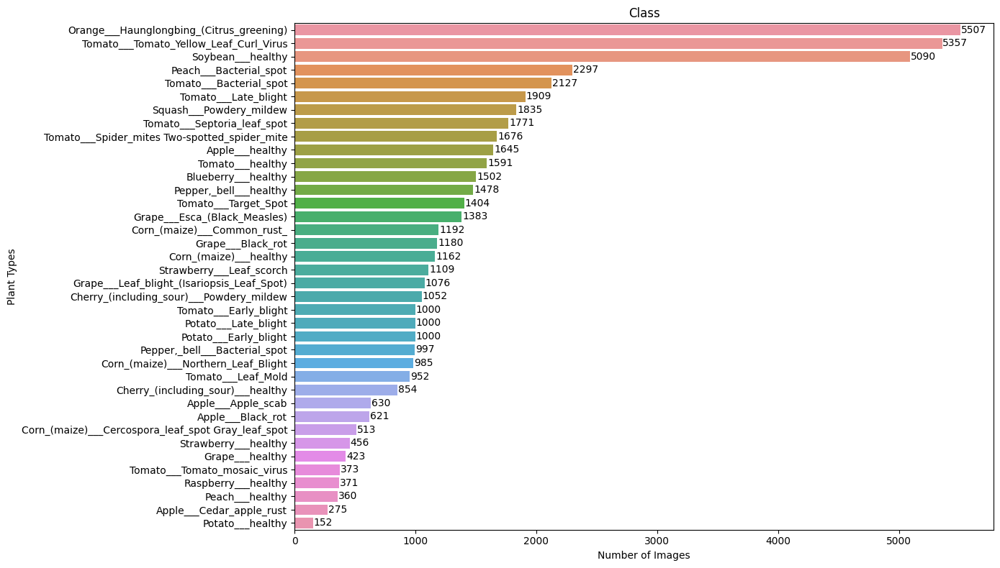

In [5]:
class_counts = df['label'].value_counts()

plt.figure(figsize=(14, 8))
x = seaborn.barplot(x=class_counts.values, y=class_counts.index, orient='h')
plt.title('Class')
plt.xlabel('Number of Images')
plt.ylabel('Plant Types')
plt.tight_layout()  

for i, v in enumerate(class_counts.values):
    x.text(v + 5, i, str(v), color='black', va='center')

plt.show()

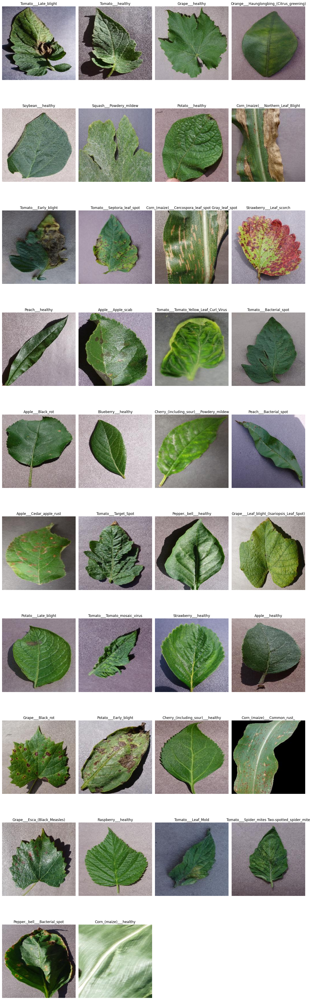

In [6]:
num_classes = len(df['label'].unique())

num_images_per_row = 4
num_rows = (num_classes + num_images_per_row - 1) // num_images_per_row

plt.figure(figsize=(15, 5 * num_rows))  

for i, plant_class in enumerate(df['label'].unique()):
    plt.subplot(num_rows, num_images_per_row, i + 1)
    path = os.path.join(data_dir, df[df['label'] == plant_class]['image_path'].iloc[0])

    if os.path.exists(path):
        sample_image = cv2.imread(path)
        if sample_image is not None:
            plt.imshow(cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB))
            plt.title(plant_class)
            plt.axis('off')
        else:
            print(f"Error: Unable to load image from path: {path}")
    else:
        print(f"Error: Image path does not exist: {path}")

plt.tight_layout()
plt.show()

In [7]:
# spliting data into train test validation
train_df_val_df, test_df = train_test_split(df, test_size=0.2, random_state=42)
train_df, val_df = train_test_split(train_df_val_df, test_size=0.2, random_state=42)

In [8]:
def load_images_for_cnn(train_df, val_df, test_df, batch_size=32, target_size=(224, 224)):
    
    train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True
    )

    train_generator = train_datagen.flow_from_dataframe(
        train_df,
        x_col='image_path',
        y_col='label',
        target_size=target_size,
        batch_size=batch_size,
        class_mode='categorical'
    )

    validation_datagen = ImageDataGenerator(rescale=1./255)

    validation_generator = validation_datagen.flow_from_dataframe(
        val_df,
        x_col='image_path',
        y_col='label',
        target_size=target_size,
        batch_size=batch_size,
        class_mode='categorical'
    )

    test_datagen = ImageDataGenerator(rescale=1./255)

    test_generator = test_datagen.flow_from_dataframe(
        test_df,
        x_col='image_path',
        y_col='label',
        target_size=target_size,
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False
    )
    
    return train_generator, validation_generator, test_generator

In [9]:
target_size = (128, 128)
input_shape = (128, 128, 3)

In [10]:
train_generator, validation_generator, test_generator = load_images_for_cnn(train_df, val_df, test_df, batch_size=32, target_size=target_size)

Found 34755 validated image filenames belonging to 38 classes.
Found 8689 validated image filenames belonging to 38 classes.
Found 10861 validated image filenames belonging to 38 classes.


In [11]:
!pip install einops
!pip install timm


ERROR: Could not find a version that satisfies the requirement einops (from versions: none)
ERROR: No matching distribution found for einops


In [12]:
import torch
import torch.optim as optim
from torch.nn import functional as F
from torch import nn
from torch.utils.data import DataLoader, Dataset
from collections import OrderedDict


In [21]:
!git config --global --unset http.proxy
!git config --global --unset https.proxy


In [22]:
!git clone https://github.com/ekojsalim/pengcit-restoration.git repo

Cloning into 'repo'...
fatal: unable to access 'https://github.com/ekojsalim/pengcit-restoration.git/': Could not resolve host: github.com


In [18]:
from repo.uformer.model.model import Uformer

ModuleNotFoundError: No module named 'repo'

In [ ]:
# Uformer Weights are not exactly the same name
def load_checkpoint(model, weights):
    checkpoint = torch.load(weights)
    try:
        model.load_state_dict(checkpoint["state_dict"])
    except:
        state_dict = checkpoint["state_dict"]
        new_state_dict = OrderedDict()
        for k, v in state_dict.items():
            name = k[7:] if 'module.' in k else k
            new_state_dict[name] = v
        model.load_state_dict(new_state_dict)

### Models

## The MobilNetV2 Architecture

In [12]:
base_model = MobileNetV2(  weights=None, include_top=False, input_shape=input_shape)

base_model.load_weights("/kaggle/input/mobilnetv2/mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1-0_224_no_top.h5")
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
learning_rate = 0.00001

# Transfer Learning to imporve accuracy
# Unfreezing layers in the MobileNetV2 model
# By unfreezing the last 40 layers in the MobileNetV2 model, 
# we are allowing those layers to adapt to this specific dataset 

n = 40
base_model.trainable = True
for layer in model.layers[:-n]:
    layer.trainable = False

model.compile(optimizer=Adam(learning_rate=learning_rate), loss='categorical_crossentropy', metrics=['accuracy'])


In [13]:
epochs = 15
history = model.fit(train_generator, epochs=epochs, validation_data=validation_generator)

Epoch 1/15
1087/1087 [==============================] - 421s 379ms/step - loss: 1.4061 - accuracy: 0.6663 - val_loss: 0.6892 - val_accuracy: 0.8148
Epoch 2/15
1087/1087 [==============================] - 411s 378ms/step - loss: 0.3721 - accuracy: 0.8990 - val_loss: 0.2734 - val_accuracy: 0.9220
Epoch 3/15
1087/1087 [==============================] - 415s 382ms/step - loss: 0.2322 - accuracy: 0.9325 - val_loss: 0.1769 - val_accuracy: 0.9448
Epoch 4/15
1087/1087 [==============================] - 418s 384ms/step - loss: 0.1789 - accuracy: 0.9466 - val_loss: 0.1365 - val_accuracy: 0.9556
Epoch 5/15
1087/1087 [==============================] - 410s 377ms/step - loss: 0.1476 - accuracy: 0.9552 - val_loss: 0.1099 - val_accuracy: 0.9654
Epoch 6/15
1087/1087 [==============================] - 412s 379ms/step - loss: 0.1227 - accuracy: 0.9633 - val_loss: 0.1142 - val_accuracy: 0.9613
Epoch 7/15
1087/1087 [==============================] - 413s 380ms/step - loss: 0.1082 - accuracy: 0.9655 - val_

In [14]:
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

340/340 [==============================] - 86s 254ms/step - loss: 0.0725 - accuracy: 0.9768
Test Loss: 0.07245621085166931, Test Accuracy: 0.9767976999282837


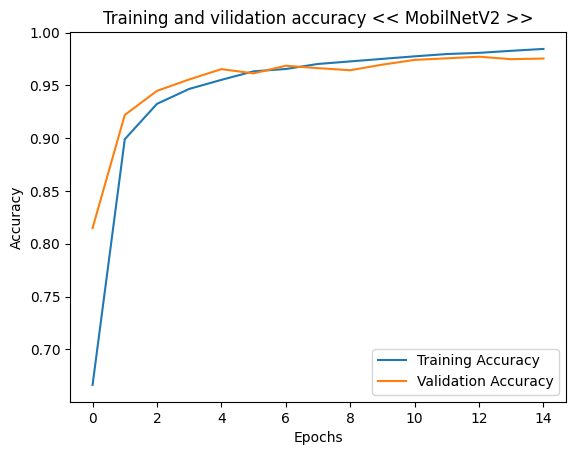

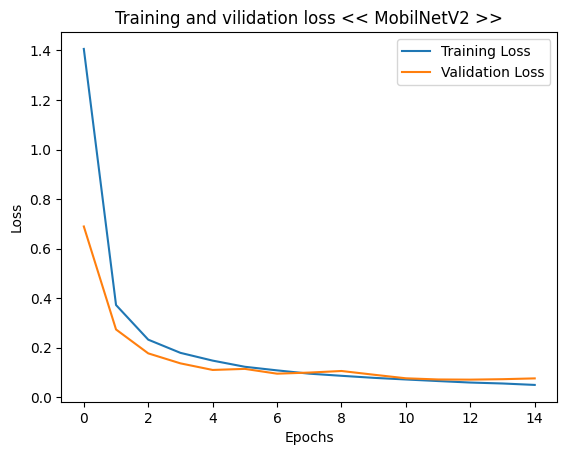

In [15]:
# Plot training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title("Training and vilidation accuracy << MobilNetV2 >>")

plt.show()

# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title("Training and vilidation loss << MobilNetV2 >>")

plt.legend()
plt.show()

In [16]:
test_predictions = model.predict(test_generator)
test_predicted_labels = np.argmax(test_predictions, axis=1)
test_true_labels = test_generator.classes

340/340 [==============================] - 22s 63ms/step


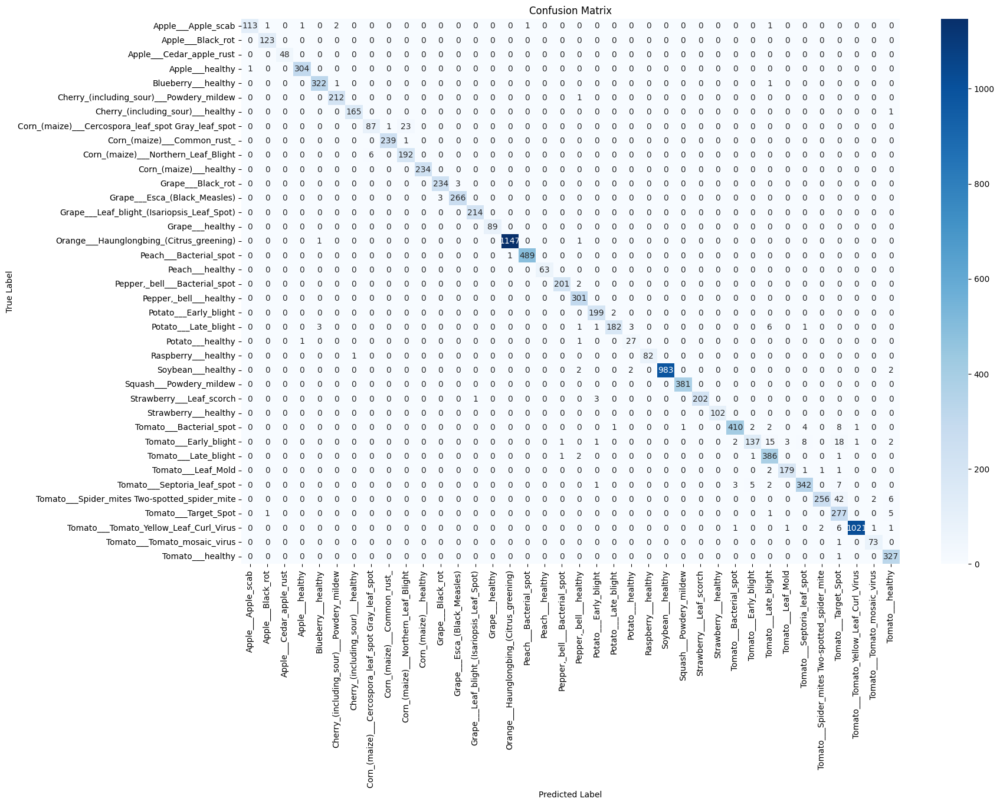

In [17]:
plt.figure(figsize=(18, 12))
conf_matrix = confusion_matrix(test_true_labels, test_predicted_labels)
class_names = [label for label in np.unique(df['label'])]
seaborn.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [18]:
#precision
precision = precision_score(test_true_labels, test_predicted_labels, average='macro')

# recall
recall = recall_score(test_true_labels, test_predicted_labels, average='macro')

# F1-score
f1 = f1_score(test_true_labels, test_predicted_labels, average='macro')

print('precision : ', precision ,'\nRecall : ', recall, '\nF1-mesure : ', f1)

precision :  0.9720733293482867 
Recall :  0.9691298956644566 
F1-mesure :  0.9693522131682456


In [19]:
labels = {
    0: 'Apple___Apple_scab',
    1: 'Apple___Black_rot',
    2: 'Apple___Cedar_apple_rust',
    3: 'Apple___healthy',
    4: 'Blueberry___healthy',
    5: 'Cherry_(including_sour)___Powdery_mildew',
    6: 'Cherry_(including_sour)___healthy',
    7: 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
    8: 'Corn_(maize)___Common_rust_',
    9: 'Corn_(maize)___Northern_Leaf_Blight',
    10: 'Corn_(maize)___healthy',
    11: 'Grape___Black_rot',
    12: 'Grape___Esca_(Black_Measles)',
    13: 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
    14: 'Grape___healthy',
    15: 'Orange___Haunglongbing_(Citrus_greening)',
    16: 'Peach___Bacterial_spot',
    17: 'Peach___healthy',
    18: 'Pepper,_bell___Bacterial_spot',
    19: 'Pepper,_bell___healthy',
    20: 'Potato___Early_blight',
    21: 'Potato___Late_blight',
    22: 'Potato___healthy',
    23: 'Raspberry___healthy',
    24: 'Soybean___healthy',
    25: 'Squash___Powdery_mildew',
    26: 'Strawberry___Leaf_scorch',
    27: 'Strawberry___healthy',
    28: 'Tomato___Bacterial_spot',
    29: 'Tomato___Early_blight',
    30: 'Tomato___Late_blight',
    31: 'Tomato___Leaf_Mold',
    32: 'Tomato___Septoria_leaf_spot',
    33: 'Tomato___Spider_mites Two-spotted_spider_mite',
    34: 'Tomato___Target_Spot',
    35: 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
    36: 'Tomato___Tomato_mosaic_virus',
    37: 'Tomato___healthy'
}

In [ ]:
model.save('my_leaf_classification_model_MobileNetV2.h5')

## The Xception Architecture

In [20]:
# Xception
base_model = Xception(weights=None, include_top = False, input_shape=input_shape)

base_model.load_weights("/kaggle/input/xception/xception_weights_tf_dim_ordering_tf_kernels_notop.h5")

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

model_1 = Model(inputs=base_model.input, outputs=predictions)

learning_rate = 0.00001

n = 40
base_model.trainable = True
for layer in base_model.layers[:-n]:
    layer.trainable = False

model_1.compile(optimizer=Adam(learning_rate=learning_rate), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
epochs = 15
history_1 = model_1.fit(train_generator, epochs=epochs, validation_data=validation_generator)

Epoch 1/15
1087/1087 [==============================] - 476s 426ms/step - loss: 1.6108 - accuracy: 0.6164 - val_loss: 0.4779 - val_accuracy: 0.8735
Epoch 2/15
1087/1087 [==============================] - 455s 418ms/step - loss: 0.3825 - accuracy: 0.8973 - val_loss: 0.2221 - val_accuracy: 0.9322
Epoch 3/15
1087/1087 [==============================] - 457s 420ms/step - loss: 0.2291 - accuracy: 0.9343 - val_loss: 0.1409 - val_accuracy: 0.9565
Epoch 4/15
1087/1087 [==============================] - 453s 416ms/step - loss: 0.1653 - accuracy: 0.9531 - val_loss: 0.1099 - val_accuracy: 0.9651
Epoch 5/15
1087/1087 [==============================] - 457s 420ms/step - loss: 0.1338 - accuracy: 0.9593 - val_loss: 0.0920 - val_accuracy: 0.9710
Epoch 6/15
1087/1087 [==============================] - 450s 414ms/step - loss: 0.1079 - accuracy: 0.9678 - val_loss: 0.0753 - val_accuracy: 0.9758
Epoch 7/15
1087/1087 [==============================] - 452s 416ms/step - loss: 0.0890 - accuracy: 0.9733 - val_

In [ ]:
test_loss, test_accuracy = model_1.evaluate(test_generator)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

In [ ]:
# Plot training and validation accuracy
plt.plot(history_1.history['accuracy'], label='Training Accuracy')
plt.plot(history_1.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title("Training and vilidation accuracy << Xception >>")
plt.legend()
plt.show()

# Plot training and validation loss
plt.plot(history_1.history['loss'], label='Training Loss')
plt.plot(history_1.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title("Training and vilidation loss << Xception >>")
plt.legend()
plt.show()

In [ ]:
test_predictions = model_1.predict(test_generator)
test_predicted_labels = np.argmax(test_predictions, axis=1)
test_true_labels = test_generator.classes

In [ ]:
#precision
precision = precision_score(test_true_labels, test_predicted_labels, average='macro')

# recall
recall = recall_score(test_true_labels, test_predicted_labels, average='macro')

# F1-score
f1 = f1_score(test_true_labels, test_predicted_labels, average='macro')

print('precision : ', precision ,'\nRecall : ', recall, '\nF1-mesure : ', f1)

In [ ]:
model_1.save('my_leaf_classification_model_Xception.h5')

## The InceptionV3 architecture

In [ ]:
# InceptionV3
base_model = InceptionV3(weights=None, include_top = False, input_shape=input_shape)
base_model.load_weights("/kaggle/input/inceptionv3/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5")

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

model_2 = Model(inputs=base_model.input, outputs=predictions)

learning_rate = 0.00001

n = 40
base_model.trainable = True
for layer in base_model.layers[:-n]:
    layer.trainable = False

model_2.compile(optimizer=Adam(learning_rate=learning_rate), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
epochs = 15
history_2 = model_2.fit(train_generator, epochs=epochs, validation_data=validation_generator)

In [ ]:
test_loss, test_accuracy = model_2.evaluate(test_generator)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

In [ ]:
# Plot training and validation accuracy
plt.plot(history_2.history['accuracy'], label='Training Accuracy')
plt.plot(history_2.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title("Training and vilidation accuracy << InceptionV3 >>")

plt.legend()
plt.show()

# Plot training and validation loss
plt.plot(history_2.history['loss'], label='Training Loss')
plt.plot(history_2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title("Training and vilidation loss << InceptionV3 >>")

plt.legend()
plt.show()

In [ ]:
test_predictions = model_2.predict(test_generator)
test_predicted_labels = np.argmax(test_predictions, axis=1)
test_true_labels = test_generator.classes

In [ ]:
#precision
precision = precision_score(test_true_labels, test_predicted_labels, average='macro')

# recall
recall = recall_score(test_true_labels, test_predicted_labels, average='macro')

# F1-score
f1 = f1_score(test_true_labels, test_predicted_labels, average='macro')

print('precision : ', precision ,'\nRecall : ', recall, '\nF1-mesure : ', f1)

In [ ]:
model_2.save('my_leaf_classification_model_InceptionV3.h5')

## The EffecientNetB7 Architecture

In [36]:
# EfficientNetB7
base_model = EfficientNetB7(weights=None, include_top = False, input_shape=(128, 128,3))
base_model.load_weights("/kaggle/input/efficientnetb7/efficientnetb7_notop.h5")

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

model_3 = Model(inputs=base_model.input, outputs=predictions)

learning_rate = 0.00001

n = 40
base_model.trainable = True
for layer in base_model.layers[:-n]:
    layer.trainable = False

model_3.compile(optimizer=Adam(learning_rate=learning_rate), loss='categorical_crossentropy', metrics=['accuracy'])

In [30]:
epochs = 15
history_3 = model_3.fit(train_generator, epochs=epochs, validation_data=validation_generator)

Epoch 1/15


2024-07-13 08:35:05.366533: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_5/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


KeyboardInterrupt: 

In [ ]:
test_loss, test_accuracy = model_3.evaluate(test_generator)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

In [ ]:
# Plot training and validation accuracy
plt.plot(history_3.history['accuracy'], label='Training Accuracy')
plt.plot(history_3.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title("Training and vilidation accuracy << EfficientNetB7 >>")
plt.show()

# Plot training and validation loss
plt.plot(history_3.history['loss'], label='Training Loss')
plt.plot(history_3.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title("Training and vilidation loss << EfficientNetB7 >>")
plt.show()

In [ ]:
test_predictions = model_3.predict(test_generator)
test_predicted_labels = np.argmax(test_predictions, axis=1)
test_true_labels = test_generator.classes

In [ ]:
#precision
precision = precision_score(test_true_labels, test_predicted_labels, average='macro')

# recall
recall = recall_score(test_true_labels, test_predicted_labels, average='macro')

# F1-score
f1 = f1_score(test_true_labels, test_predicted_labels, average='macro')

print('precision : ', precision ,'\nRecall : ', recall, '\nF1-mesure : ', f1)

In [ ]:
model_3.save('my_leaf_classification_model_EfficientNetB7.h5')

## The EffecientNetV2_M Architecture

In [ ]:
# EfficientNetB7
base_model = EfficientNetV2M(weights=None, include_top = False, input_shape=input_shape)
base_model.load_weights("/kaggle/input/efficientnetb7/efficientnetb7_notop.h5")

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

model_4 = Model(inputs=base_model.input, outputs=predictions)

learning_rate = 0.00001

n = 20
base_model.trainable = True
for layer in base_model.layers[:-n]:
    layer.trainable = False

model_4.compile(optimizer=Adam(learning_rate=learning_rate), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
test_loss, test_accuracy = model_4.evaluate(test_generator)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

In [ ]:
# Plot training and validation accuracy
plt.plot(history_4.history['accuracy'], label='Training Accuracy')
plt.plot(history_4.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title("Training and vilidation accuracy << EfficientNetV2_M >>")
plt.show()

# Plot training and validation loss
plt.plot(history_4.history['loss'], label='Training Loss')
plt.plot(history_4.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title("Training and vilidation loss << EfficientNetV2_M >>")
plt.show()

In [ ]:
test_predictions = model_4.predict(test_generator)
test_predicted_labels = np.argmax(test_predictions, axis=1)
test_true_labels = test_generator.classes

### Image Test

In [ ]:
def preprocess_image(img):
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  # Normalize the image
    
    return img_array
    

In [ ]:
MobileNetV2 = load_model('/kaggle/working/my_leaf_classification_model_MobileNetV2.h5')

In [ ]:
MobileNetV2_test_loss, MobileNetV2_test_accuracy = MobileNetV2.evaluate(test_generator)
print(f"Test Loss: {MobileNetV2_test_loss}, Test Accuracy: {MobileNetV2_test_accuracy}")

In [ ]:
DenseNet169 = load_model('/kaggle/working/my_leaf_classification_model_DenseNet169.h5')

In [ ]:
DenseNet169_test_loss, DenseNet169_test_accuracy = DenseNet169.evaluate(test_generator)
print(f"Test Loss: {DenseNet169_test_loss}, Test Accuracy: {DenseNet169_test_accuracy}")

In [ ]:
InceptionV3 = load_model('/kaggle/working/my_leaf_classification_model_InceptionV3.h5')

In [ ]:
InceptionV3_test_loss, InceptionV3_test_accuracy = InceptionV3.evaluate(test_generator)
print(f"Test Loss: {InceptionV3_test_loss}, Test Accuracy: {InceptionV3_test_accuracy}")

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

models = ("MobileNetV2", "DenseNet169", "InceptionV3")
test_results = {
    'Test Accuracy': (MobileNetV2_test_accuracy*100, DenseNet169_test_accuracy*100, InceptionV3_test_accuracy*100),
    'Test Loss': (MobileNetV2_test_loss*100, DenseNet169_test_loss*100, InceptionV3_test_loss*100)
}

x = np.arange(len(models))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for attribute, measurement in test_results.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Accuracy (%)')
ax.set_title('Plant Disease Detection Models')
ax.set_xticks(x + width, models)
ax.legend(loc='upper left', ncols=3)
ax.set_ylim(0, 250)

plt.show()